In [37]:
from keras.applications.vgg16 import VGG16
import keras.backend as K

import numpy as np
import matplotlib.pyplot as plt
import sys

In [29]:
def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [2]:
model = VGG16()
model.summary()

Instructions for updating:
Colocations handled automatically by placer.
553467904/553467096 [==============================] - 1946s 4us/step
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    


In [70]:
def get_filter_image(layer_name, filter_index):
    layer_name = layer_name
    filter_index = filter_index

    layer_output = model.get_layer(layer_name).output
    cur_filter = layer_output[:,:,:,filter_index]
    loss = K.mean(cur_filter)


    # Compute gradient of input w.r.t loss.
    grads = K.gradients(loss,model.input)[0]
    # Normalize grads.
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # Iterate to optimize input image.
    input_image = np.random.random((1,150, 150, 3)) * 20. + 128.
    func = K.function(inputs=[model.input], outputs=[loss,grads])

    epochs = 50
    cols = 10
    rows = int(epochs/cols)+1
    #fig = plt.figure(figsize=(cols*2,rows))
    lr = .5
    losses = []
    for i in range(epochs):
        loss_, grads_ = func([input_image])
        losses.append(loss_)
        input_image = input_image + lr * grads_
        #print(input_image.shape)
        #plt.subplot(rows,cols,i+1)
        #plt.imshow(deprocess_image(input_image[0].copy()))
        sys.stdout.write("\rfilter_index:{} {}/{} loss:{}".format(filter_index,i+1,epochs,loss_))
    #print()
    #fig = plt.figure(figsize=(5,5))
    #plt.imshow(deprocess_image(input_image[0].copy()))
    #plt.show()
    img = deprocess_image(input_image[0].copy())
    return img, losses

Layer:block1_conv1
filter_index:9 50/50 loss:46.411453247070315

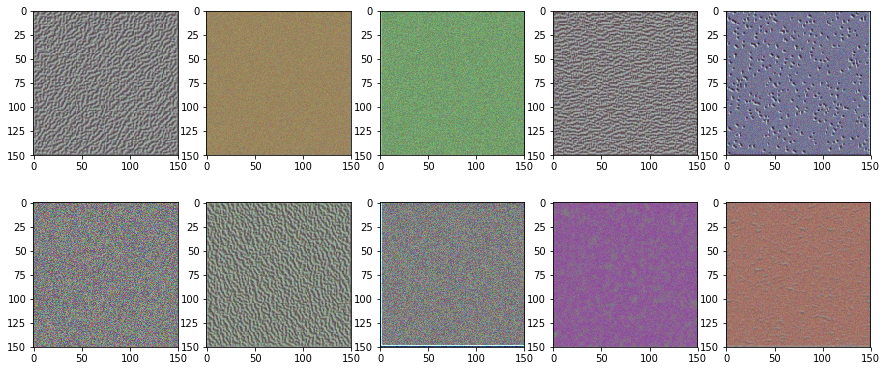

Layer:block1_conv2
filter_index:9 50/50 loss:146.812393188476563

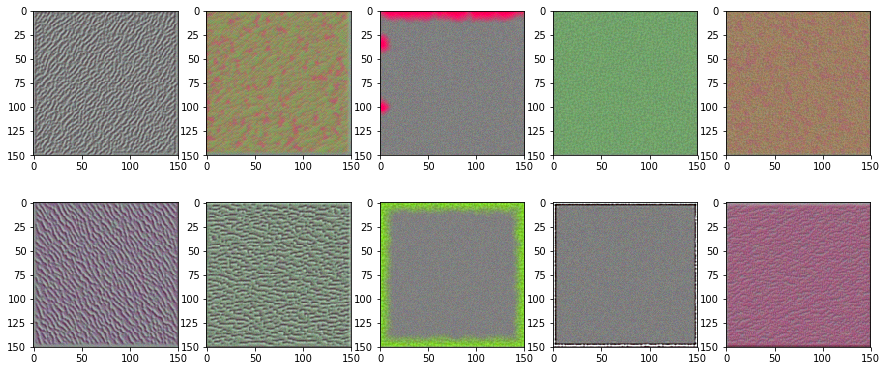

Layer:block2_conv1
filter_index:9 50/50 loss:542.88342285156255

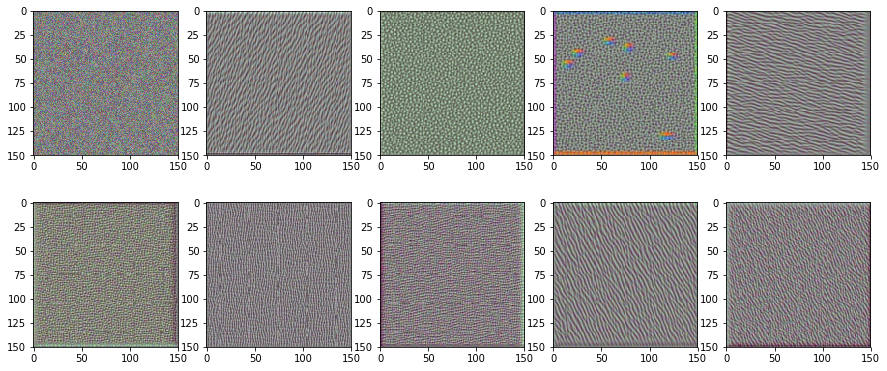

Layer:block2_conv2
filter_index:9 50/50 loss:936.34277343759385

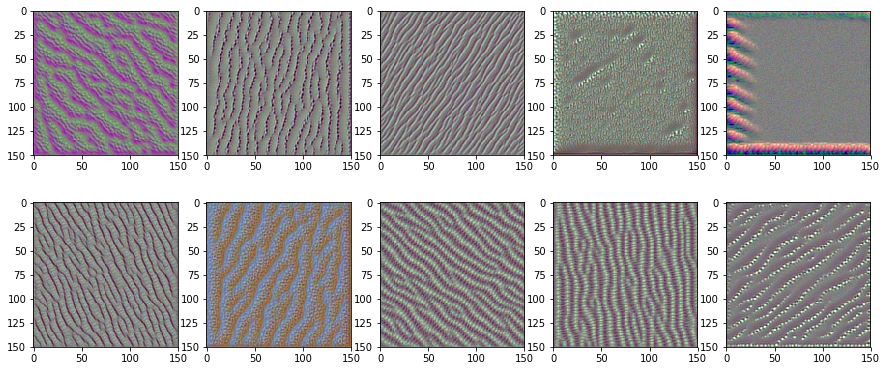

Layer:block3_conv1
filter_index:9 50/50 loss:3076.4328613281255

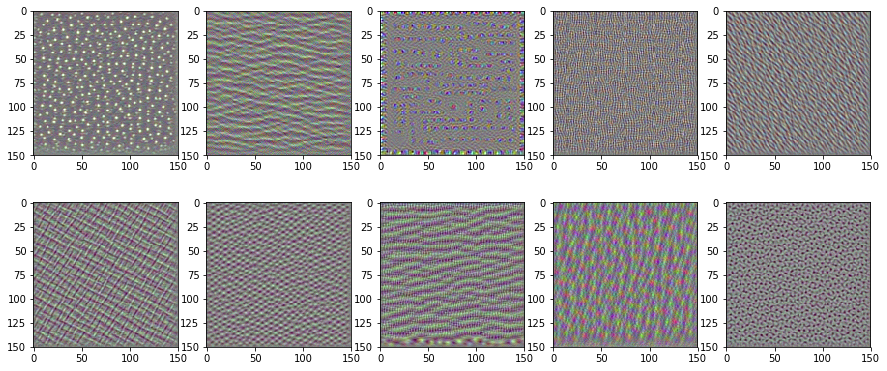

Layer:block3_conv2
filter_index:9 50/50 loss:3097.5485839843755

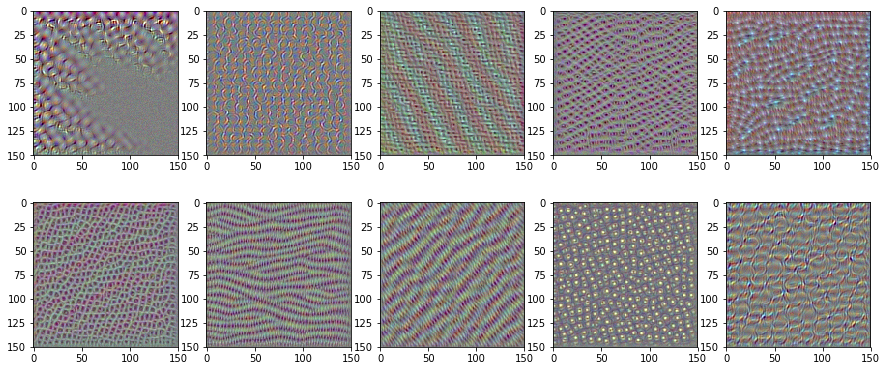

Layer:block3_conv3
filter_index:9 50/50 loss:6461.3862304687555

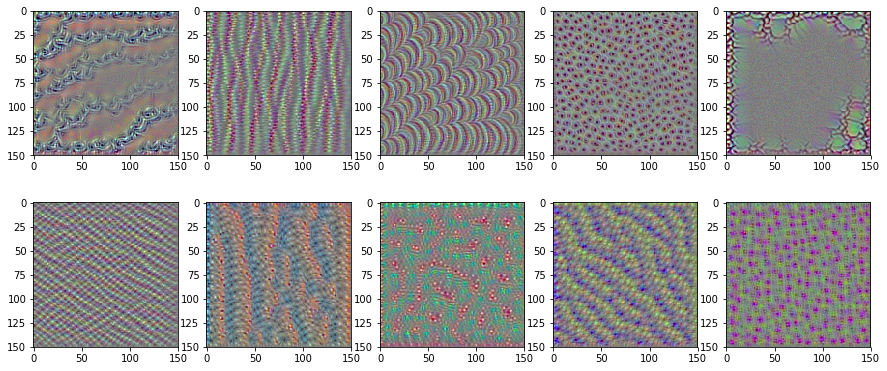

Layer:block4_conv1
filter_index:9 50/50 loss:0.0721274137496955

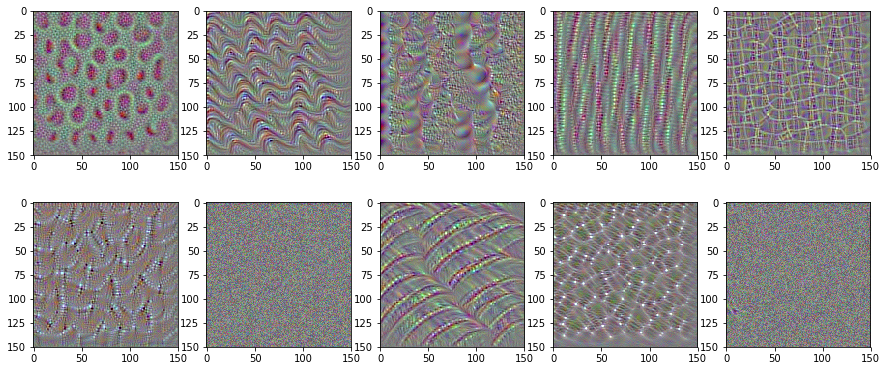

Layer:block4_conv2
filter_index:9 50/50 loss:1932.6292724609375

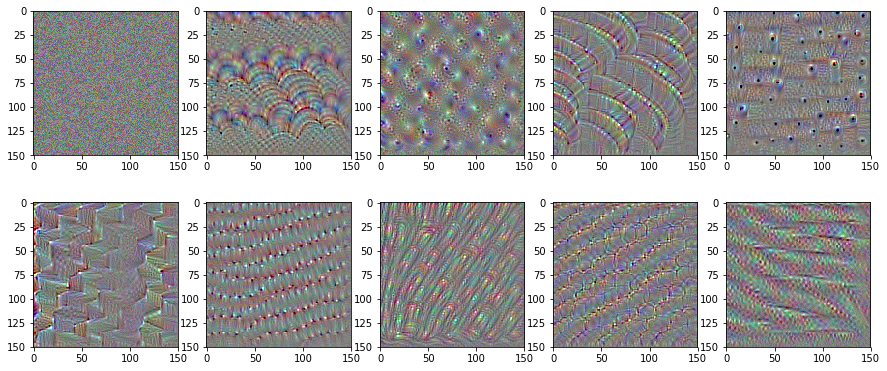

Layer:block4_conv3
filter_index:9 50/50 loss:523.158264160156254

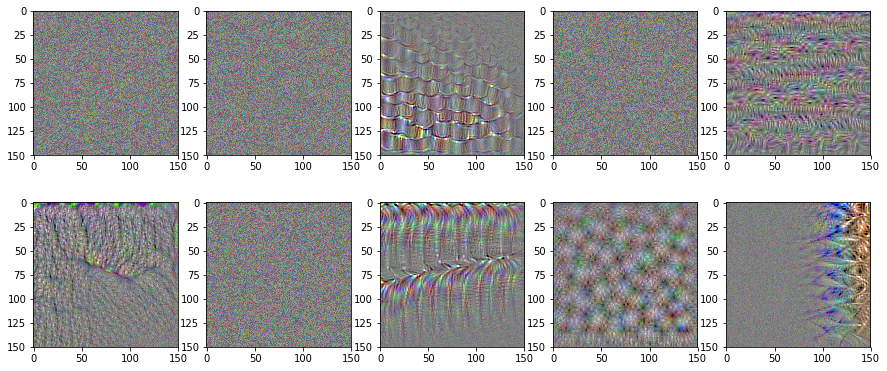

Layer:block5_conv1
filter_index:9 50/50 loss:1182.4226074218755

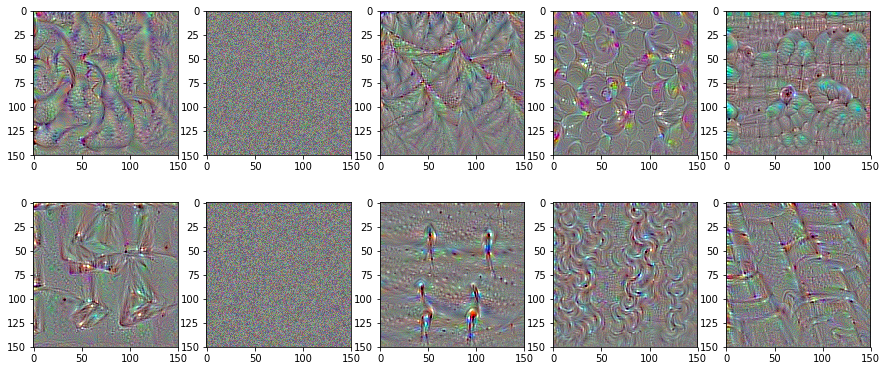

Layer:block5_conv2
filter_index:9 50/50 loss:0.0.190612792968855

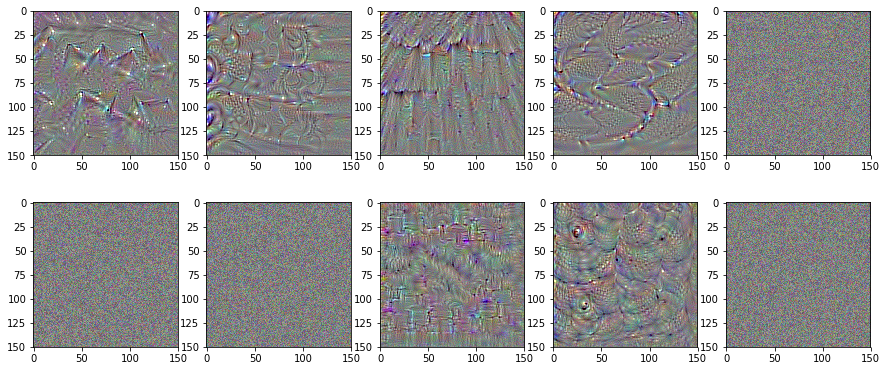

Layer:block5_conv3
filter_index:9 50/50 loss:0.0.420837402343754

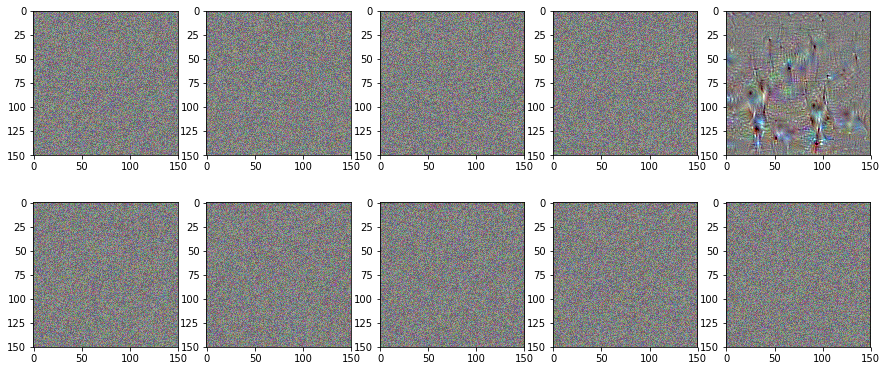

In [77]:
layer_name = ["block1_conv1","block1_conv2","block2_conv1","block2_conv2","block3_conv1","block3_conv2",
             "block3_conv3","block4_conv1","block4_conv2","block4_conv3","block5_conv1","block5_conv2",
             "block5_conv3"]
filter_index = [0,1,2,3,4,5,6,7,8,9]
cols = 5
rows = int(len(filter_index)/cols) + 1
for name in layer_name:
    print("Layer:{}".format(name))
    plt.figure(figsize=(15,10))
    for i,index in enumerate(filter_index):
        img, losses = get_filter_image(layer_name = name, filter_index=index)        
        plt.subplot(rows,cols,i+1)
        plt.imshow(img)
    plt.show()